In [1]:
# Importing the libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import geopandas as gpd
from shapely.geometry import Point
from pandas import DataFrame
from geopandas import GeoDataFrame
from bokeh.plotting import save, figure
from bokeh.models import GeoJSONDataSource
from bokeh.models import ColumnDataSource, HoverTool, LogColorMapper
import pysal as ps
from bokeh.io import output_file, show

C:\Users\jwhoj\Anaconda3\lib\site-packages\pysal\__init__.py:65: VisibleDeprecationWarning: PySAL's API will be changed on 2018-12-31. The last release made with this API is version 1.14.4. A preview of the next API version is provided in the `pysalnext` package. The API changes and a guide on how to change imports is provided at https://migrating.pysal.org
  ), VisibleDeprecationWarning)


In [2]:
# C:/Users/jwhoj/Downloads/convertcsv.geojson
# C:/Users/jwhoj/Downloads/zipcode.json

#C:/Users/jwhoj/Desktop/Capstone_1/KC_house_data.csv
#C:/Users/jwhoj/Desktop/admin/zipcode.shp

In [3]:
# Importing the dataframe
df = pd.read_csv('C:/Users/jwhoj/Desktop/Capstone_1/KC_house_data.csv', index_col='zipcode')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
zipcode,,,,,,,,,,,,,,,,,,,,
98178,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650
98125,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639
98028,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,47.7379,-122.233,2720,8062
98136,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,47.5208,-122.393,1360,5000
98074,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,47.6168,-122.045,1800,7503


In [4]:
df = df[['price', 'bedrooms', 'bathrooms', 'sqft_living', 'lat', 'long']]

In [5]:
df.head()

,price,bedrooms,bathrooms,sqft_living,lat,long
zipcode,,,,,,
98178,221900.0,3,1.00,1180,47.5112,-122.257
98125,538000.0,3,2.25,2570,47.7210,-122.319
98028,180000.0,2,1.00,770,47.7379,-122.233
98136,604000.0,4,3.00,1960,47.5208,-122.393
98074,510000.0,3,2.00,1680,47.6168,-122.045


In [6]:
# Groupby zipcode and price
df = df.groupby(['zipcode'])['price'].mean()

In [7]:
df

zipcode
98001    2.808047e+05
98002    2.342840e+05
98003    2.941113e+05
98004    1.356524e+06
98005    8.102897e+05
98006    8.599386e+05
98007    6.172540e+05
98008    6.456282e+05
98010    4.236660e+05
98011    4.903771e+05
98014    4.556171e+05
98019    4.248151e+05
98022    3.157093e+05
98023    2.867428e+05
98024    5.806379e+05
98027    6.170540e+05
98028    4.624889e+05
98029    6.126427e+05
98030    2.961880e+05
98031    3.005399e+05
98032    2.512962e+05
98033    8.039908e+05
98034    5.217400e+05
98038    3.668761e+05
98039    2.161300e+06
98040    1.194874e+06
98042    3.116321e+05
98045    4.395073e+05
98052    6.452442e+05
98053    6.782757e+05
             ...     
98092    3.349211e+05
98102    9.015162e+05
98103    5.850488e+05
98105    8.632289e+05
98106    3.195814e+05
98107    5.791098e+05
98108    3.556785e+05
98109    8.800778e+05
98112    1.096239e+06
98115    6.199441e+05
98116    6.186951e+05
98117    5.768348e+05
98118    4.176453e+05
98119    8.497148e+05
98

In [8]:
# Import King County Shapefile for Zipcode Map 
%matplotlib inline
import geopandas as gpd
kc = gpd.read_file('C:/Users/jwhoj/Desktop/admin/zipcode.shp')
kc = kc[kc.COUNTY == '033']

In [9]:
kc.head()

,ZIP,ZIPCODE,COUNTY,ZIP_TYPE,Shape_area,Shape_len,geometry
0,98031,98031,033,Standard,2.280129e+08,117508.232813,"POLYGON ((1297645.018999994 162673.5240000039,..."
1,98032,98032,033,Standard,4.826754e+08,166737.665152,(POLYGON ((1291868.054000005 164132.6790000051...
2,98030,98030,033,Standard,2.000954e+08,94409.538568,"POLYGON ((1299384.719999999 144186.7479999959,..."
3,98029,98029,033,Standard,2.774247e+08,111093.715481,"POLYGON ((1358323.971000001 215228.4819999933,..."
4,98028,98028,033,Standard,1.996531e+08,71488.230747,"POLYGON ((1297496.656000003 283648.5799999982,..."


In [10]:
kc = kc.to_crs({'init': 'epsg:4326'})

In [11]:
kc = kc[['ZIPCODE','COUNTY','Shape_area','Shape_len','geometry']]

In [12]:
# Changing column names
kc.columns = ['zipcode', 'county', 'shape_area', 'shape_len', 'geometry']

In [13]:
kc = kc.set_index('zipcode')

In [14]:
kc.head()

,county,shape_area,shape_len,geometry
zipcode,,,,
98031,033,2.280129e+08,117508.232813,POLYGON ((-122.2184228994867 47.43750364811834...
98032,033,4.826754e+08,166737.665152,(POLYGON ((-122.2418694982228 47.4412158001988...
98030,033,2.000954e+08,94409.538568,POLYGON ((-122.2100582763942 47.38691615994036...
98029,033,2.774247e+08,111093.715481,POLYGON ((-121.9764222505507 47.58429568011995...
98028,033,1.996531e+08,71488.230747,POLYGON ((-122.2278797268681 47.76909367694529...


In [15]:
kc.index = kc.index.astype('int64')

In [16]:
df.index = df.index.astype('int64')

In [17]:
# Merge CSV and SHPfile
## result = new df 
result = pd.DataFrame(df).merge(kc, left_index=True, right_index=True, how='outer')
result.head()

,price,county,shape_area,shape_len,geometry
zipcode,,,,,
98001,2.808047e+05,033,5.324255e+08,156155.468916,"POLYGON ((-122.2906117408714 47.3553926363363,..."
98002,2.342840e+05,033,2.055688e+08,102448.491058,POLYGON ((-122.2292099972944 47.35375439597274...
98003,2.941113e+05,033,3.170769e+08,120498.897895,POLYGON ((-122.3029950795136 47.35745194979003...
98004,1.356524e+06,033,2.505455e+08,99214.851674,"POLYGON ((-122.211950849367 47.64641883344281,..."
98005,8.102897e+05,033,2.113641e+08,116409.338972,"POLYGON ((-122.153543615987 47.66056221339741,..."


In [18]:
result.shape

(85, 5)

In [19]:
type(result.index)

pandas.core.indexes.numeric.Int64Index

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely.geometry import Point


from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#Display all columns instead of "..." truncation
pd.options.display.max_columns = None

#No scientific notation
pd.set_option('display.float_format', lambda x: '%.3f' % x)

#Set plot sizes
plt.rcParams["figure.figsize"] = 10, 10

# Import Bokeh 

In [21]:
from bokeh.io import output_file, output_notebook, show
from bokeh.plotting import figure, ColumnDataSource
output_notebook()
from bokeh.models import LogColorMapper, LogTicker, ColorBar, MercatorTicker, AdaptiveTicker
from bokeh.models import (
    GeoJSONDataSource,
    HoverTool,
    LinearColorMapper,
    ColorBar,
    BasicTicker,
    PrintfTickFormatter,
    LogColorMapper,
    Range1d,
    Plot,
    Text
)

Loading BokehJS ...

In [22]:
def convert_GeoPandas_to_Bokeh_format(gdf):
    """
    Function to convert a GeoPandas GeoDataFrame to a Bokeh
    ColumnDataSource object.
    
    :param: (GeoDataFrame) gdf: GeoPandas GeoDataFrame with polygon(s) under
                                the column name 'geometry.'
                                
    :return: ColumnDataSource for Bokeh.
    """
    gdf_new = gdf.drop('geometry', axis=1).copy()
    gdf_new['x'] = gdf.apply(getGeometryCoords, 
                             geom='geometry', 
                             coord_type='x', 
                             shape_type='polygon', 
                             axis=1)
    
    gdf_new['y'] = gdf.apply(getGeometryCoords, 
                             geom='geometry', 
                             coord_type='y', 
                             shape_type='polygon', 
                             axis=1)
    
    return ColumnDataSource(gdf_new)


def getGeometryCoords(row, geom, coord_type, shape_type):
    """
    Returns the coordinates ('x' or 'y') of edges of a Polygon exterior.
    
    :param: (GeoPandas Series) row : The row of each of the GeoPandas DataFrame.
    :param: (str) geom : The column name.
    :param: (str) coord_type : Whether it's 'x' or 'y' coordinate.
    :param: (str) shape_type
    """
    
     # Parse the geometries and grab the coordinate
    geometry = row[geom]
    #print(geometry.type)

    if geometry.type=='Polygon':
        if coord_type == 'x':
            # Get the x coordinates of the exterior
            # Interior is more complex: xxx.interiors[0].coords.xy[0]
            return list( geometry.exterior.coords.xy[0] )
        elif coord_type == 'y':
            # Get the y coordinates of the exterior
            return list( geometry.exterior.coords.xy[1] )

    if geometry.type in ['Point', 'LineString']:
        if coord_type == 'x':
            return list( geometry.xy[0] )
        elif coord_type == 'y':
            return list( geometry.xy[1] )

    if geometry.type=='MultiLineString':
        all_xy = []
        for ea in geometry:
            if coord_type == 'x':
                all_xy.append(list( ea.xy[0] ))
            elif coord_type == 'y':
                all_xy.append(list( ea.xy[1] ))
        return all_xy

    if geometry.type=='MultiPolygon':
        all_xy = []
        for ea in geometry:
            if coord_type == 'x':
                all_xy.append(list( ea.exterior.coords.xy[0] ))
            elif coord_type == 'y':
                all_xy.append(list( ea.exterior.coords.xy[1] ))
        return all_xy

    else:
        # Finally, return empty list for unknown geometries
        return []

In [23]:
KC_Source = convert_GeoPandas_to_Bokeh_format(result)

In [24]:
p = figure(title="King County")
p.multi_line('x', 'y', source=KC_Source, color="black", line_width=2)
show(p)

In [25]:
from bokeh.models import (
    Range1d,
    GeoJSONDataSource,
    HoverTool,
    LinearColorMapper,
    GMapPlot, GMapOptions, ColumnDataSource, 
    Circle, DataRange1d, PanTool, WheelZoomTool, BoxSelectTool
)

In [26]:
result.head()

,price,county,shape_area,shape_len,geometry
zipcode,,,,,
98001,280804.691,033,532425522.912,156155.469,"POLYGON ((-122.2906117408714 47.3553926363363,..."
98002,234284.035,033,205568823.842,102448.491,POLYGON ((-122.2292099972944 47.35375439597274...
98003,294111.279,033,317076893.012,120498.898,POLYGON ((-122.3029950795136 47.35745194979003...
98004,1356523.991,033,250545476.332,99214.852,"POLYGON ((-122.211950849367 47.64641883344281,..."
98005,810289.696,033,211364085.629,116409.339,"POLYGON ((-122.153543615987 47.66056221339741,..."


In [27]:
result['x'] = result.apply(getGeometryCoords, 
                                 geom='geometry', 
                                 coord_type='y', 
                                 shape_type='point',
                                 axis=1)
                                 
result['y'] = result.apply(getGeometryCoords, 
                                 geom='geometry', 
                                 coord_type='x', 
                                 shape_type='point',
                                 axis=1)


In [28]:
result.head()

,price,county,shape_area,shape_len,geometry,x,y
zipcode,,,,,,,
98001,280804.691,033,532425522.912,156155.469,"POLYGON ((-122.2906117408714 47.3553926363363,...","[47.355392636336305, 47.355174059745565, 47.35...","[-122.29061174087144, -122.29061369503825, -12..."
98002,234284.035,033,205568823.842,102448.491,POLYGON ((-122.2292099972944 47.35375439597274...,"[47.35375439597274, 47.35375422328178, 47.3537...","[-122.22920999729438, -122.22920977076902, -12..."
98003,294111.279,033,317076893.012,120498.898,POLYGON ((-122.3029950795136 47.35745194979003...,"[47.357451949790025, 47.35745281414918, 47.357...","[-122.30299507951355, -122.30263878493292, -12..."
98004,1356523.991,033,250545476.332,99214.852,"POLYGON ((-122.211950849367 47.64641883344281,...","[47.64641883344281, 47.64639700785335, 47.6463...","[-122.21195084936703, -122.21195400769086, -12..."
98005,810289.696,033,211364085.629,116409.339,"POLYGON ((-122.153543615987 47.66056221339741,...","[47.66056221339741, 47.66056019827933, 47.6605...","[-122.15354361598703, -122.1534212964264, -122..."


In [29]:
result = result.drop(['geometry','county','shape_area','shape_len'], axis=1)

In [30]:
result.head()

,price,x,y
zipcode,,,
98001,280804.691,"[47.355392636336305, 47.355174059745565, 47.35...","[-122.29061174087144, -122.29061369503825, -12..."
98002,234284.035,"[47.35375439597274, 47.35375422328178, 47.3537...","[-122.22920999729438, -122.22920977076902, -12..."
98003,294111.279,"[47.357451949790025, 47.35745281414918, 47.357...","[-122.30299507951355, -122.30263878493292, -12..."
98004,1356523.991,"[47.64641883344281, 47.64639700785335, 47.6463...","[-122.21195084936703, -122.21195400769086, -12..."
98005,810289.696,"[47.66056221339741, 47.66056019827933, 47.6605...","[-122.15354361598703, -122.1534212964264, -122..."


In [31]:
from bokeh.palettes import Spectral6

In [32]:
DF_Source = ColumnDataSource(data=dict(x=result['x'],
                                      y=result['y'],
                                      price=result['price'].values
                                      ))

In [33]:
TOOLS = "pan,wheel_zoom,box_zoom,reset,hover,save" 

In [34]:
Elevated = figure(title="King County \'House Prices\' ", 
                tools=TOOLS,
                x_axis_location=None, 
                y_axis_location=None)   

In [35]:
Elevated.multi_line('x', 
                    'y', 
                    source=KC_Source, 
                    color="black", 
                    line_width=2)

GlyphRenderer(id='1140', ...)

In [36]:
Elevated.circle('x', 
                'y',
                source=DF_Source,
                size=4,
                color='red')

GlyphRenderer(id='1147', ...)

In [37]:
hover = Elevated.select_one(HoverTool)
hover.point_policy = "follow_mouse"

In [38]:
hover.tooltips = [
        ("Price", "@price"),
        ("Zipcode", "@zipcode"),
        ("(Long, Lat)", "($x, $y)"),
        ]

In [39]:
show(Elevated)

In [40]:
## tool tips
## https://bokeh.pydata.org/en/latest/docs/user_guide/tools.html 

# Working on Patches 

In [41]:
# C:/Users/jwhoj/Downloads/convertcsv.geojson
# C:/Users/jwhoj/Downloads/zipcode.json

In [42]:
df.head()

zipcode
98001    280804.691
98002    234284.035
98003    294111.279
98004   1356523.991
98005    810289.696
Name: price, dtype: float64

In [43]:
# Read in converted CSV dataframe (now geojson)
from bokeh.io import show, output_notebook, output_file
from bokeh.models import (
    GeoJSONDataSource,
    HoverTool,
    LinearColorMapper,
    ColorBar,
    BasicTicker,
    PrintfTickFormatter,
    LogColorMapper,
    Range1d,
    Plot,
    Text
)
from bokeh.plotting import figure
import geopandas as gpd
with open('C:/Users/jwhoj/Downloads/convertcsv.geojson', 'r') as f:
        geo_source = GeoJSONDataSource(geojson=f.read())

        df = gpd.read_file('C:/Users/jwhoj/Downloads/convertcsv.geojson')
        price = df['price']
        bedrooms = df['bedrooms']
        bathrooms = df['bathrooms']
        sqft = df['sqft_living']

In [44]:
colors = ['#000003', '#3B0F6F', '#8C2980', '#DD4968', '#FD9F6C', '#FBFCBF']
colors.reverse()
color_mapper = LogColorMapper(palette=colors, low=price.min(), high=price.max())

TOOLS = "pan,wheel_zoom,box_zoom,reset,hover,save"

In [45]:
p = figure(title="King County House Prices", tools=TOOLS, x_axis_location=None, y_axis_location=None, width=800, height=800)
p.grid.grid_line_color = None
p.title.text_font_size = '30pt'

In [46]:
p.patches('x', 'y', fill_alpha=0.9, fill_color={'field': 'price', 'transform': color_mapper},
         line_color='black', line_width=1, source=KC_Source)

GlyphRenderer(id='1248', ...)

In [47]:
hover = p.select_one(HoverTool)
hover.point_policy = "follow_mouse"
hover.tooltips = [("Zipcode", "@zipcode"),
                      ("Price", "@price"),
                 ("(Long, Lat)", "($x, $y)")]

In [49]:
from bokeh.models import LogColorMapper, LogTicker, ColorBar, AdaptiveTicker

In [50]:
color_bar = ColorBar(color_mapper=color_mapper, ticker=AdaptiveTicker(),
                     label_standoff=12, border_line_color=None, location=(0,0))
p.add_layout(color_bar, 'right')

In [51]:
show(p)

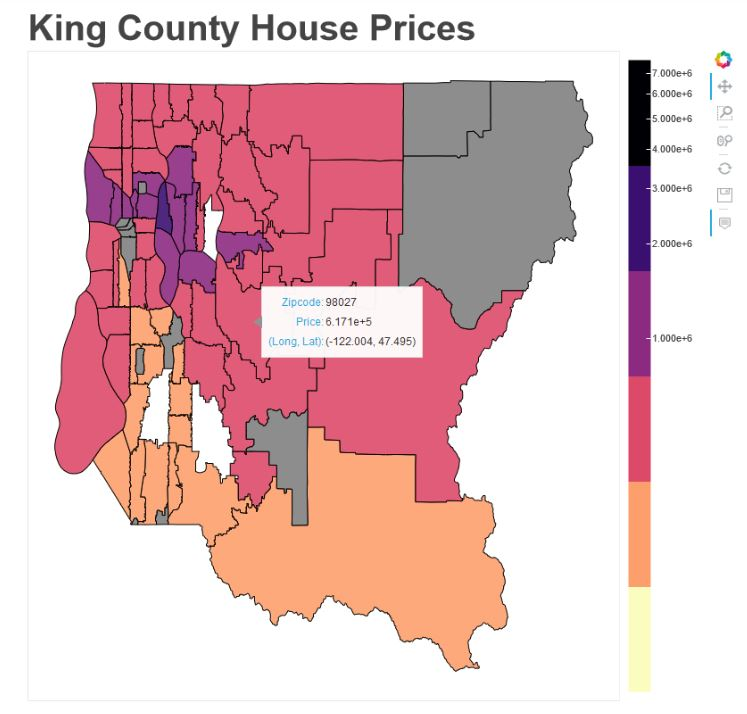

In [3]:
# Since Bokeh does not render on Github, here is the JPG 
from IPython.display import Image
img = 'C:/Users/jwhoj/Desktop/map.jpg'
Image(filename=img)

In [52]:
## http://michael-harmon.com/blog/IntroToBokeh.html 
## group by zipcode 
## plot new df (result) on top of KC_source 
## color zipcodes https://stackoverflow.com/questions/52322999/how-to-populate-a-div-with-hover-text-in-bokeh 
## choropleth https://towardsdatascience.com/a-complete-guide-to-an-interactive-geographical-map-using-python-f4c5197e23e0 

In [ ]:
#https://towardsdatascience.com/data-visualization-with-bokeh-in-python-part-one-getting-started-a11655a467d4
#https://towardsdatascience.com/data-visualization-with-bokeh-in-python-part-ii-interactions-a4cf994e2512
#https://towardsdatascience.com/data-visualization-with-bokeh-in-python-part-iii-a-complete-dashboard-dc6a86aa6e23